# Geospatial analysis of New York City Airbnb data & modeling price

In this project I am looking the the [New York City Airbnb dataset from Kaggle](https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data/notebooks). 

First, I explore the data through basic data visualizations and some interactive maps. In Section 3.1 I define some additional variables, such as the distance between Airbnb listings and top NYC sights like the Empire State Building and the Brooklyn Bridge. I investigate what effect these variables have on price in Section 3.2. This is done via linear models using different sets of variables. In Section 3.3, along with Linear Regression, I use Random Forest and Gradient Boosting regressions for price prediction and compare their performance.

### Table of Contents

* [1 Preparations](#prep)
* [2 Exploratory Data Analysis](#EDA)
    * [2.1 Basic visualizations](#dataviz)
    * [2.2 Geospatial Analysis](#geo)
* [3 Modeling price](#methods)
    * [3.1 Feature engineering](#pred)
    * [3.2 Models for explaining price](#models)
        * [3.2.1 Model 1 - No location variables](#model1)
        * [3.2.2 Model 2 - Borough dummies](#model2)
        * [3.2.3 Model 3 - Distance from sights](#model3)
    * [3.3 Models for predicting price](#pred)
* [4 Summary](#summary)


## 1. Preparations <a class="anchor" id="prep"></a>

In [1]:
# Basics:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Geospatial analysis:
import geopandas as gpd 
from geopandas.tools import geocode
import folium # interactive maps
from folium import Circle, Marker,GeoJson,Icon
from folium.plugins import HeatMap, MarkerCluster
import math
from geopy.geocoders import Nominatim
from geopy import distance

# Linear regression:
import statsmodels.api as sm
# Predictions:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error


/Users/matevaradi/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# Defining colors for the visualizations that match Airbnb's design
color1="#FF5A60"
color2="#565a5d"
color3="#cfd1cc"
color4="#007a87"

# Setting style for visualizations",
sns.set_style("darkgrid")

In [3]:
# Loading data
nyc_data = pd.read_csv('AB_NYC_2019.csv')
nyc_data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


#### Data cleaning

The data is well structured for the analysis we intend to perform, but we have to look at missing values.

Let's have a look at which columns have missing values:

In [4]:
print(nyc_data.isnull().sum(axis=0))

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64


We only want to use `reviews_per_month` from the columns that have NaNs. The rest of the columns with missing values can simply be deleted. For reviews_per_month, simple mean imputation will suffice.

In [5]:
cols_without_nans=list(nyc_data.columns[~nyc_data.isna().any()])
# Only keeping columns with no NaNs and reviews_per_month:
nyc_data=nyc_data[cols_without_nans+["reviews_per_month"]]

# Impute the mean for the reviews_per_month column:
nyc_data=nyc_data.fillna(nyc_data.mean())

print("\n")
print("Any NaNs after cleaning?:",nyc_data.isnull().any().any())




Any NaNs after cleaning?: False


## 2. Exploratory Data Analysis <a class="anchor" id="EDA"></a>
### 2.1 Basic visualizations <a class="anchor" id="dataviz"></a>

In [6]:
nyc_data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,reviews_per_month
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,7.143982,112.781327,1.373221
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,32.952519,131.622289,1.497775
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,1.000000,0.000000,0.010000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,1.000000,0.000000,0.280000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,1.000000,45.000000,1.220000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.000000,227.000000,1.580000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,327.000000,365.000000,58.500000


There are 48,895 Airbnb listings in the dataset. Each have location data, which we'll use. Price is given per night, in USD. Surprisingly, there are free Airbnbs in New York City. How nice! The median is 106 USD, which is quite expensive. The number of reviews and the number of reviews per month can be a proxy for how many guests have been at the place. 

Strangely, there is no data on how many guests these places can welcome, although this piece of information could be quite useful. We don't have any data on number stars given in the reviews either. 

Let's zoom in on some of these features.

#### Price

[Text(0.5, 1.0, 'Price distribution of Airbnb listings below 2000 $ per night')]

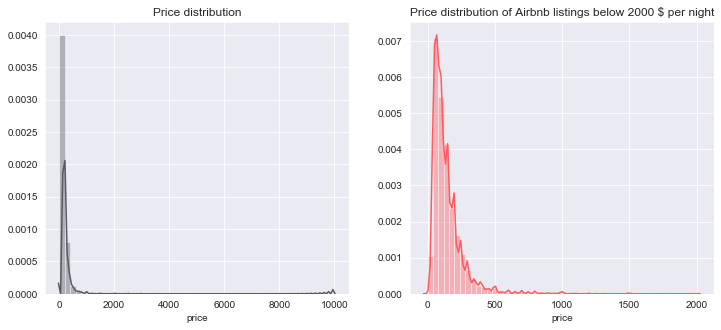

In [7]:
f, axes = plt.subplots(1, 2,figsize=(12,5))
sns.distplot(nyc_data["price"],color=color2,ax=axes[0]).set(title="Price distribution")
sns.distplot(nyc_data[nyc_data["price"]<2000]["price"],color=color1,ax=axes[1]).set(
    title="Price distribution of Airbnb listings below 2000 $ per night")

As expected, the price distribution is very skewed to the right: there are a few incredibly pricey listings, but the majority of them are around 100-250 USD per night. Due to this skewness, I will use the natural logarithm of price for linear regressions.

#### Number of reviews  / Number of reviews per month

[Text(0.5, 0, ''),
 Text(0.5, 1.0, 'Distribution of the number of reviews per listing per month')]

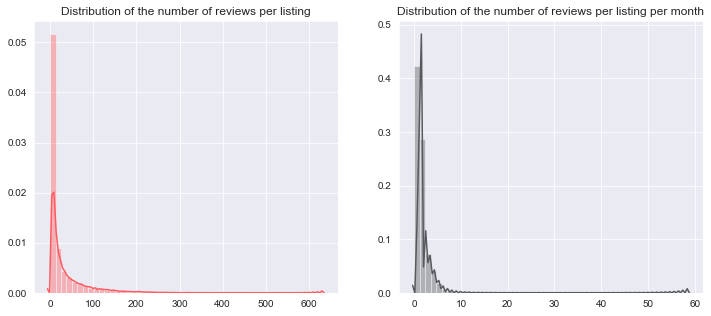

In [8]:
f, axes = plt.subplots(1, 2,figsize=(12,5))
sns.distplot(nyc_data["number_of_reviews"],color=color1,ax=axes[0]).set(
    title="Distribution of the number of reviews per listing",xlabel="")
sns.distplot(nyc_data.dropna()["reviews_per_month"],color=color2,ax=axes[1]).set(
    title="Distribution of the number of reviews per listing per month",xlabel="")

The number of reviews (aka the number of guests, or the place's popularity) is also skewed to the right. 

#### Room type

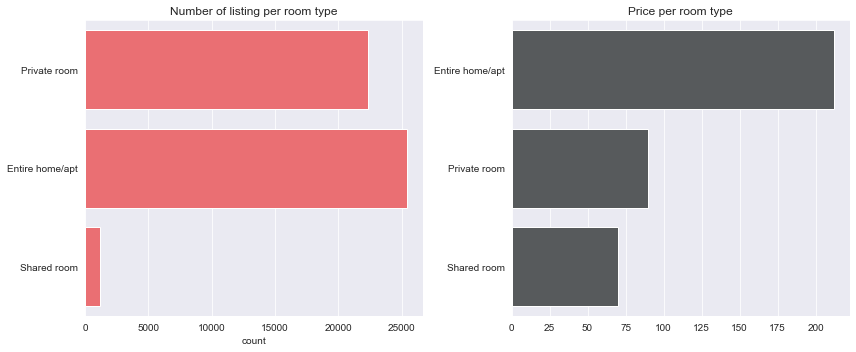

In [9]:
f, axes = plt.subplots(1, 2,figsize=(12,5))
sns.countplot(y="room_type",data=nyc_data,orient="h",
                color=color1,ax=axes[0]).set(title='Number of listing per room type', ylabel='')

sns.barplot(y=list(nyc_data.groupby("room_type").mean()["price"].index),
            x=list(nyc_data.groupby("room_type").mean()["price"].values),
            ax=axes[1],color=color2,orient="h").set(title='Price per room type')

plt.tight_layout()

Entire homes and private rooms are more common. As to be expected, entire homes are much more expensive than rooms.

#### Boroughs and neighbourhoods

The most neighborhoods with the most Airbnb listings are:  

Williamsburg
Bedford-Stuyvesant
Harlem
Bushwick
Upper West Side
Hell's Kitchen
East Village
Upper East Side
Crown Heights
Midtown


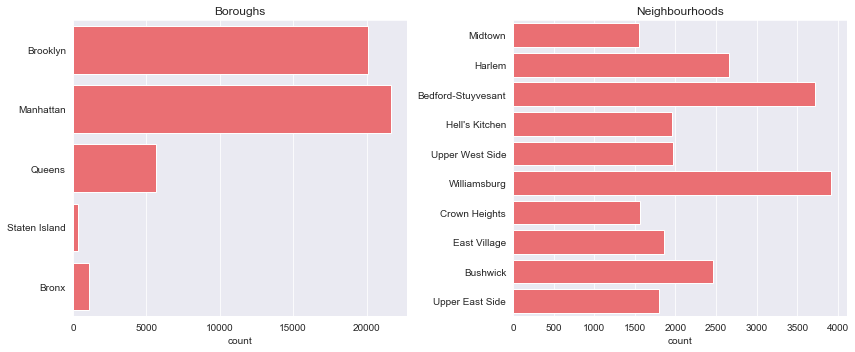

In [10]:
f, axes = plt.subplots(1, 2,figsize=(12,5))
sns.countplot(y="neighbourhood_group",data=nyc_data,orient="h",
                color=color1,ax=axes[0]).set(title='Boroughs', ylabel='')

most_frequent_neighborhoods=nyc_data["neighbourhood"].value_counts()[0:10].index.tolist()
print("The most neighborhoods with the most Airbnb listings are:  \n")
for neighborhood in most_frequent_neighborhoods:
    print(neighborhood)

sns.countplot(y="neighbourhood",data=nyc_data[nyc_data["neighbourhood"].isin(most_frequent_neighborhoods)]
            ,orient="h",color=color1,ax=axes[1]).set(title='Neighbourhoods', ylabel='')
plt.tight_layout()

Brooklyn and Manhattan have the most Airbnbs. Regarding neighbourhoods, Williamsburg, Bedford-Stuyvesant and Harlem are the ones where we would find the most options to choose from. 

Let's look the average prices for the five boroughs:

[Text(0, 0.5, 'Price'),
 Text(0.5, 0, 'Borough'),
 Text(0.5, 1.0, 'Average price in the five boroughs according to room type')]

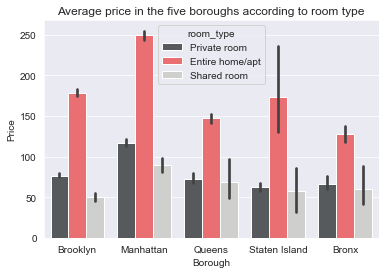

In [11]:
# Defining a color palette
palette ={"Private room": color2, "Entire home/apt": color1, "Shared room": color3}
sns.barplot(x='neighbourhood_group', y='price', hue='room_type',data=nyc_data,palette=palette).set(
    ylabel="Price",xlabel="Borough",title="Average price in the five boroughs according to room type")

Manhattan is the most expensive, followed by Brooklyn.

### 2.2 Geospatial analysis <a class="anchor" id="geo"></a>

I use folium to create an interactive map with all the Airbnb listings of the dataset. The map has Times Square as its center point. The bubbles show many listings there are in that area. Clicking on the bubbles zoomes on the map.  

In [12]:
TimesSquare=[40.758896,-73.985130] #Latitude and longitude of Times Square

# Creating a map with Time Square as its starting location:
m_1 = folium.Map(location=TimesSquare, tiles='cartodbpositron', zoom_start=12)

# Add markers for Airbnb listings:
mc = MarkerCluster()
for idx, row in nyc_data.iterrows():
    if not math.isnan(row['longitude']) and not math.isnan(row['latitude']):
        mc.add_child(Marker([row['latitude'], row['longitude']]))
m_1.add_child(mc)

# Display the map
m_1

Another way to visualize where most of the Airbnb's are is via a heatmap. Let's see:

In [13]:
m_2 = folium.Map(location=TimesSquare, tiles='cartodbpositron', zoom_start=11)

# Add a heatmap to the base map
HeatMap(data=nyc_data[['latitude', 'longitude']], radius=10).add_to(m_2)

# Display the map
m_2

## 3.  Models for price <a class="anchor" id="methods"></a>

Now I will create models to explain and predict the price of Airbnb listings. 

Latitude and longitude variables are hardly of any use in themselves in a regression, but they can be very informative when used right. For example, a tourist may look at the location of an Airbnb and place it in the city relative to the tourist attractions they want to see. Therefore, I calculate the distances of the Airbnb apartments and rooms of the dataset from the most popular sights of New York city. Hopefully these variables will be informative in the models for price.

### 3.1 Feature Engineering <a class="anchor" id="features"></a>

In [14]:
# Get the names of top tourist attractions (according to Google)
top_sights=["Empire State Building","Central Park","Times Square","Brooklyn Bridge",
            "The Metropolitan Museum of Art","Museum of Modern Art","Rockefeller Center",
            "The High Line","Grand Central Terminal","One World Trade Center"]

# This object can be used to return latitude and longitude values for a named location
locator = Nominatim(user_agent="myGeocoder")

# We will store the location data for top sights in the top_sights list
top_sight_locations=[]
for sight in top_sights:
    location=locator.geocode(sight)
    top_sight_locations.append((location.latitude,location.longitude))
    
# Let's check if we all locations are correct (i.e. are in New York City) by displaying them on a map
m_3 = folium.Map(location=TimesSquare, tiles='cartodbpositron', zoom_start=12)

for i in range(len(top_sight_locations)):
    loc=top_sight_locations[i]
    Marker([loc[0], loc[1]],popup=top_sights[i],icon=Icon(color="gray")).add_to(m_3)

# Display the map
m_3

Seems correct! Now let's define a function to compute the distance between two points. I use geopy to do this

In [17]:
def get_distance(loc_from,loc_to):
    """
    Returns the distance between two locations
    Input: 
        loc_from: tuple or list of latitude and longitude coordinates
        loc_to:   tuple or list of latitude and longitude coordinates
        
    Output: 
        dis:      distance (in kilometers)
    """
    dis=distance.distance(loc_from,loc_to).km   
    return dis

Let's look at an example.

In [18]:
# Example - the second row entry of the database is a "Skylit Midtown Castle":
SkylitMidtownCastle=nyc_data.iloc[1]
SkylitMidtownCastle_distances = [get_distance(
                        (SkylitMidtownCastle.latitude,SkylitMidtownCastle.longitude),
                        (sight[0],sight[1])) 
                        for sight in top_sight_locations]
print("Distance from: \n")
for i in range(len(top_sights)):
    print(top_sights[i],": ",round(SkylitMidtownCastle_distances[i],2),"kilometers")

Distance from: 

Empire State Building :  0.6 kilometers
Central Park :  3.59 kilometers
Times Square :  0.44 kilometers
Brooklyn Bridge :  5.43 kilometers
The Metropolitan Museum of Art :  3.35 kilometers
Museum of Modern Art :  1.03 kilometers
Rockefeller Center :  0.7 kilometers
The High Line :  1.9 kilometers
Grand Central Terminal :  0.56 kilometers
One World Trade Center :  5.15 kilometers


Let us also visualize these distances:

In [19]:
# Create the map
m_4 = folium.Map(location=TimesSquare, tiles='cartodbpositron', zoom_start=12)

# Add the Airbnb listing
Marker([SkylitMidtownCastle.latitude, SkylitMidtownCastle.longitude],
       popup="Skylit Midtown Castle",icon=Icon(color=color1)).add_to(m_4)

# Add top sights and lines between them and the Skylit Midtown Castle
for i in range(len(top_sight_locations)):
    loc=top_sight_locations[i]
    Marker([loc[0], loc[1]],popup=top_sights[i],icon=Icon(color="gray")).add_to(m_4)
    line_from_SkylitMidtownCastle=folium.PolyLine(locations=[
        [SkylitMidtownCastle.latitude, SkylitMidtownCastle.longitude],[loc[0], loc[1]]],
                                                  weight=2,color=color1,
                                                  tooltip=((str(round(SkylitMidtownCastle_distances[i],2)))+" km"))
    m_4.add_children(line_from_SkylitMidtownCastle)
    
# Display map
m_4

/Users/matevaradi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: color argument of Icon should be one of: {'black', 'lightblue', 'blue', 'pink', 'lightgreen', 'darkgreen', 'darkblue', 'beige', 'red', 'purple', 'white', 'green', 'gray', 'lightgray', 'darkpurple', 'orange', 'lightred', 'cadetblue', 'darkred'}.
  
/Users/matevaradi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  app.launch_new_instance()


Now that we are confident that our calculations are right, we can compute the distances for all entries in our dataset

In [20]:
for i in range(len(top_sights)): # Loop through all the top sights
    column_name="dist_from_"+top_sights[i].replace(" ","_").lower()
    # Calculate the distances from each Airbnb listing
    distances=nyc_data.apply(lambda x: get_distance((x["latitude"],x["longitude"]),(top_sight_locations[i])),axis=1)
    # Add distances to our dataframe
    nyc_data[column_name]=distances

print(len(top_sights)," new columns added to the dataset.")

10  new columns added to the dataset.


Maybe for some guests it's not the proximity to a certain tourist attraction is what matters, but that is near to at least one important tourist attraction. To capture this behavior, we can calculate the distance to the closest top attraction:


In [21]:
# calculate distance to closest_sight
nyc_data["dist_to_nearest_sight"]=nyc_data[[colname for colname in nyc_data.columns 
                                            if colname.startswith("dist_from")]].apply(min,axis=1)

## 3.2 Models for explaining price <a class="anchor" id="models"></a>

In all of the models, the dependent variable will be the log of price. Again, log transformation is performed because the distribution of prices is skewed.

In [22]:
y=np.log(nyc_data.price+0.0001)
# (The + 0.0001 smoothing is needed because some Airbnbs have a price of 0, which we cannot take the logarithm of)

### 3.2.1 Model I - No location variables <a class="anchor" id="model1"></a>
First let's look at the case where we don't include variables that have anything to do with location - not even information on the borough.

In [23]:
# Creating a dataframe of the predictors with selected variables
X_1=pd.concat([pd.Series([1]*len(nyc_data),name="(cons)"), # for constant term
    nyc_data[["minimum_nights","reviews_per_month","number_of_reviews","availability_365"]],
# Creating dummies from room_type, shared room is the reference
pd.get_dummies(nyc_data['room_type'])[["Entire home/apt","Private room"]]], 
axis=1)

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y, test_size=0.3, random_state=24)

In [24]:
lm_1 = sm.OLS(y_train_1,X_train_1).fit()
lm_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.373
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     3388.
Date:                Sat, 26 Sep 2020   Prob (F-statistic):               0.00
Time:                        14:18:28   Log-Likelihood:                -29538.
No. Observations:               34226   AIC:                         5.909e+04
Df Residuals:                   34219   BIC:                         5.915e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
(cons)                3.8507      0.021    186.467      0.000       3.810       3.891
minimum_nights       -0.0010      0.000     -6.806      0.000      -0.001      -0.001
reviews_per_month     0.0003      0.003      0.102      0.919      -0.005       0.005
number_of_reviews    -0.0010   8.37e-05    -11.510      0.000      -0.001      -0.001
availability_365      0.0006   2.44e-05     25.816      0.000       0.001       0.001
Entire home/apt       1.2452      0.021     60.394      0.000       1.205       1.286
Private room          0.3999      0.021     19.340      0.000       0.359       0.440
==============================================================================
Omnibus:                    21481.492   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          6913468.827
Skew:                          -1.840   Prob(JB):                         0.00
Kurtosis:                      72.529   Cond. No.                     1.98e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.98e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

All variables except `reviews_per_month` are significant at 5% significance level. Surprisingly, there is negative relationship between the number of reviews and price.

### 3.2.2 Model II - Borough dummies <a class="anchor" id="model2"></a>

In our second setup, we include borough dummies.

In [25]:
# Creating a dataframe of the predictors with selected variables
X_2=pd.concat([pd.Series([1]*len(nyc_data),name="(cons)"), # for constant term
    nyc_data[["minimum_nights","reviews_per_month","number_of_reviews","availability_365"]],
# Creating dummies from neighborhood, bronx is the reference
pd.get_dummies(nyc_data['neighbourhood_group'],drop_first=True), 
# Creating dummies from room_type, shared room is the reference
pd.get_dummies(nyc_data['room_type'])[["Entire home/apt","Private room"]]], 
axis=1)

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y, test_size=0.3, random_state=24)

In [26]:
lm_2 = sm.OLS(y_train_2,X_train_2).fit()
lm_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.439
Model:                            OLS   Adj. R-squared:                  0.439
Method:                 Least Squares   F-statistic:                     2674.
Date:                Sat, 26 Sep 2020   Prob (F-statistic):               0.00
Time:                        14:18:28   Log-Likelihood:                -27634.
No. Observations:               34226   AIC:                         5.529e+04
Df Residuals:                   34215   BIC:                         5.538e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
(cons)                3.4695      0.027    126.677      0.000       3.416       3.523
minimum_nights       -0.0015      0.000    -10.688      0.000      -0.002      -0.001
reviews_per_month     0.0077      0.002      3.204      0.001       0.003       0.012
number_of_reviews    -0.0009   7.93e-05    -11.703      0.000      -0.001      -0.001
availability_365      0.0007   2.32e-05     29.830      0.000       0.001       0.001
Brooklyn              0.2650      0.020     13.125      0.000       0.225       0.305
Manhattan             0.5915      0.020     29.311      0.000       0.552       0.631
Queens                0.1413      0.021      6.611      0.000       0.099       0.183
Staten Island         0.0195      0.039      0.500      0.617      -0.057       0.096
Entire home/apt       1.1943      0.020     61.155      0.000       1.156       1.233
Private room          0.4126      0.020     21.086      0.000       0.374       0.451
==============================================================================
Omnibus:                    24312.543   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         10446277.927
Skew:                          -2.232   Prob(JB):                         0.00
Kurtosis:                      88.471   Cond. No.                     2.90e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.9e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

This second model seems to be better based on the Adj. R-squared value. In this model, `reviews_per_month` becomes significant. All four boroughs are associated with a higher price (although Staten Island is not significant), which suggests that they are all more expensive than the Bronx.

### 3.2.3 Model III - Geospatial distance variables <a class="anchor" id="model3"></a>

Finally, we include the newly created distance variables in our third and final explanatory model.

In [27]:
base_vars=["minimum_nights","reviews_per_month","number_of_reviews","availability_365"]
distance_vars=[colname for colname in nyc_data.columns if colname.startswith("dist")]

# Creating a dataframe of the predictors with selected variables
X_3=pd.concat([pd.Series([1]*len(nyc_data),name="(cons)"), # for constant term
    nyc_data[base_vars+distance_vars], 
# Creating dummies from room_type, shared room is the reference
pd.get_dummies(nyc_data['room_type'])[["Entire home/apt","Private room"]]], 
axis=1)

X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X_3, y, test_size=0.3, random_state=24)

In [28]:
lm_3 = sm.OLS(y_train_3,X_train_3).fit()
lm_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.481
Model:                            OLS   Adj. R-squared:                  0.481
Method:                 Least Squares   F-statistic:                     1866.
Date:                Sat, 26 Sep 2020   Prob (F-statistic):               0.00
Time:                        14:18:28   Log-Likelihood:                -26290.
No. Observations:               34226   AIC:                         5.262e+04
Df Residuals:                   34208   BIC:                         5.277e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
(cons)                                       4.1053      0.030    136.369      0.000       4.046       4.164
minimum_nights                              -0.0017      0.000    -13.116      0.000      -0.002      -0.001
reviews_per_month                            0.0120      0.002      5.185      0.000       0.007       0.017
number_of_reviews                           -0.0008   7.66e-05    -11.027      0.000      -0.001      -0.001
availability_365                             0.0007   2.26e-05     31.584      0.000       0.001       0.001
dist_from_empire_state_building             -0.3023      0.044     -6.851      0.000      -0.389      -0.216
dist_from_central_park                      -0.1784      0.037     -4.838      0.000      -0.251      -0.106
dist_from_times_square                       0.8546      0.118      7.258      0.000       0.624       1.085
dist_from_brooklyn_bridge                    0.1477      0.009     15.885      0.000       0.129       0.166
dist_from_the_metropolitan_museum_of_art     0.3005      0.044      6.884      0.000       0.215       0.386
dist_from_museum_of_modern_art               0.2252      0.200      1.125      0.261      -0.167       0.618
dist_from_rockefeller_center                -1.3849      0.327     -4.235      0.000      -2.026      -0.744
dist_from_the_high_line                     -0.0080      0.021     -0.386      0.700      -0.048       0.033
dist_from_grand_central_terminal             0.4705      0.062      7.579      0.000       0.349       0.592
dist_from_one_world_trade_center            -0.1507      0.013    -11.856      0.000      -0.176      -0.126
dist_to_nearest_sight                       -0.0047      0.004     -1.083      0.279      -0.013       0.004
Entire home/apt                              1.1504      0.019     61.155      0.000       1.114       1.187
Private room                                 0.4196      0.019     22.284      0.000       0.383       0.456
==============================================================================
Omnibus:                    26363.491   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         14233091.866
Skew:                          -2.532   Prob(JB):                         0.00
Kurtosis:                     102.774   Cond. No.                     2.48e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.48e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The third model results in an even larger than improvement compared to Model 1, than Model 2. Some of the newly added are significant. This suggests that the distance-from-sight variables are useful in explaining price. The fact that they are not all significant could be due to some multicollinearity. For example, the MoMA and Rockefeller Center are quite close to each other, therefore the corresponding distance variables will have a high correlation. Interestingly, there is a relatively strong positive relationship between distance from Times Square and (the log of) price. Having visited New York as a tourist, I can confirm that many of the cheap, run-down, tourist-trap hotels and hostels are close to Times Square. 

## 3.3 Models for predicting price  <a class="anchor" id="pred"></a>

When we want to accurately predict price, we use all the variables that we have. Furthermore, apart from linear regression, now we can try some more complex models that can introduce some non-linearities to the price model. I use random forest regression and gradient boosting regression.

In [29]:
base_vars=["minimum_nights","reviews_per_month","number_of_reviews","availability_365"]
distance_vars=[colname for colname in nyc_data.columns if colname.startswith("dist")]

# Creating a dataframe of the predictors with selected variables
X_4=pd.concat([nyc_data[base_vars+distance_vars], 
# Creating dummies from neighborhood, bronx is the reference
pd.get_dummies(nyc_data['neighbourhood_group'],drop_first=True), 
# Creating dummies from room_type, shared room is the reference
pd.get_dummies(nyc_data['room_type'])[["Entire home/apt","Private room"]]], 
axis=1)

X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(X_4, y, test_size=0.3, random_state=24)

In [33]:
lm = LinearRegression()
rf = RandomForestRegressor(random_state=24)
gb = GradientBoostingRegressor(max_depth=10)

# Train the models
lm.fit(X_train_4, y_train_4)
rf.fit(X_train_4, y_train_4)
gb.fit(X_train_4, y_train_4)

# Make predictions using the testing set
y_hat_lm = lm.predict(X_test_4)
y_hat_rf = rf.predict(X_test_4)
y_hat_gb = gb.predict(X_test_4)


MSE_lm=mean_squared_error(y_hat_lm,y_test_4)
MSE_rf=mean_squared_error(y_hat_rf,y_test_4)
MSE_gb=mean_squared_error(y_hat_gb,y_test_4)

print("Linear Regression Mean Squared Error:",MSE_lm)
print("Random Forest Regression Mean Squared Error:",MSE_rf)
print("Gradient Boosting Regression Mean Squared Error:",MSE_gb)

Linear Regression Mean Squared Error: 0.28517881969954095
Random Forest Regression Mean Squared Error: 0.25620631852370485
Gradient Boosting Regression Mean Squared Error: 0.27413739973650797


Random forest regression performs best. As a final step, I am curious to see how much we gained in prediction performance as a result of using the custom-made "distance-from-sight" variables. We can answer this by comparing the MSEs we just calculated with the MSEs resulting from running the same models on the explanatory variables of Model 2 of the previous section. 

In [34]:
# Train the models on the dataset without geospatial variables 
# Creating a dataframe of the predictors with selected variables
X_5=pd.concat([nyc_data[base_vars], 
# Creating dummies from neighborhood, bronx is the reference
pd.get_dummies(nyc_data['neighbourhood_group'],drop_first=True), 
# Creating dummies from room_type, shared room is the reference
pd.get_dummies(nyc_data['room_type'])[["Entire home/apt","Private room"]]], 
axis=1)

X_train_5, X_test_5, y_train_5, y_test_5 = train_test_split(X_5, y, test_size=0.3, random_state=24)

lm.fit(X_train_5, y_train_5)
rf.fit(X_train_5, y_train_5)
gb.fit(X_train_5, y_train_5)

print("Improvement for Linear Regression:",
      round((1-MSE_lm/mean_squared_error(lm.predict(X_test_5),y_test_5))*100,2),"%")
print("Improvement for Random Forest Regression:",
      round((1-MSE_lm/mean_squared_error(rf.predict(X_test_5),y_test_5))*100,2),"%")
print("Improvement for Gradient Boosting Regression:",
      round((1-MSE_lm/mean_squared_error(gb.predict(X_test_5),y_test_5))*100,2),"%")

Improvement for Linear Regression: 6.86 %
Improvement for Random Forest Regression: 6.63 %
Improvement for Gradient Boosting Regression: 2.78 %


Linear Regression and Random Forest improved substantially and Gradient Boosting Regression improved a little bit.

## 4. Summary <a class="anchor" id="summary"></a>

I have shown that creating and using geospatial variables can improve models, both in terms of explanatory and predictive power. However, we have to note that the inclusion of several distance variables at the same time introduces multicollinearity to a model. This might cause problems, if the locations from which we calculate distances are not selected carefully, or too many new variables are created in this fashion.